In [27]:
import numpy as np
from scipy.signal import argrelextrema
import matplotlib.pyplot as plt
import qcodes
import os, glob
import sys
import pandas as pd
from scipy.signal import find_peaks
from scipy.signal import savgol_filter
from qcodes.dataset import (
    initialise_or_create_database_at,
    load_or_create_experiment,    
    plot_by_id,
    load_by_run_spec
)


The following Notebook is going to characterise the non-linearity of TiN. 

I want to analyse a property induced by the nonlineaarity of the material. 

Differently from what happens for linear materials, where sending an input signal into a cavity will make it resonate just at a given resonance (the other are othogonal), nonlinearity creates a coupling between otherwise independent resonances. 
This creates some sort of "resonant families" .

My aim is to pick two rounds of two-tone measurements and detect so two families of resonances that I will label by the run of measurements they have been identified with (12 and 15). 

I will plot with 2 different colors these families on the whole transission spectrum . 


In [28]:
# Define the path to the whole-spectrum data
db_path= r"C:\Users\Nicola\Documents\CdL_Fisica\INTERNSHIP\FBK_superconducting_circuits\23_05\db_Enrico\TiN-Resonators.db"
assert os.path.exists(db_path), f"Database not found at {db_path}" 

In [29]:
# Connect to the database
initialise_or_create_database_at(db_path)


# If the experiment does not exist, it will be created
experiment = load_or_create_experiment(experiment_name="resonator_experiment", sample_name="test_sample")

# List available datasets in the experiment
experiment.data_sets()

[]

In [30]:
# Replace with the actual run ID you want to load: I want to study run 12 and 15 
run_id = 1
dataset = load_by_run_spec(captured_run_id=run_id)
dataset

print("\n")

data = dataset.get_parameter_data()

# Print all the available parameter names and their shapes
for group, params in data.items():
    print(f"\nGroup: {group}")
    for param, values in params.items():
        print(f" - {param}: shape {np.shape(values)}")




Group: VNA_S21_magnitude
 - VNA_S21_magnitude: shape (10001,)
 - VNA_S21_S21_frequency: shape (10001,)

Group: VNA_S21_phase
 - VNA_S21_phase: shape (10001,)
 - VNA_S21_S21_frequency: shape (10001,)


In [31]:
# Extract the data and memorize as "rear"
freq_rear  = data['VNA_S21_magnitude']['VNA_S21_S21_frequency']
mag_rear   = data['VNA_S21_magnitude']['VNA_S21_magnitude']
phase_rear = data['VNA_S21_phase']['VNA_S21_phase']

I first uploaded the data corresponding to the $S_{21}$ spectrum. These are the data where all the resonances are present.

Now I will also upload the two tone measurements, were just "families" of coupled resonances will appear. 

In [32]:
# Define the path to 2-tone measurements database
db_path = r"C:\Users\Nicola\Documents\CdL_Fisica\INTERNSHIP\FBK_superconducting_circuits\23_05\TiN-Resonators_20250516.db"
assert os.path.exists(db_path), f"Database not found at {db_path}" 


In [33]:
# Connect to the database
initialise_or_create_database_at(db_path)


# If the experiment does not exist, it will be created
experiment = load_or_create_experiment(experiment_name="resonator_experiment", sample_name="test_sample")

# List available datasets in the experiment
experiment.data_sets()

[]

In [34]:
# Replace with the actual run ID you want to load: I want to study run 12 and 15 
run_id = 12
dataset = load_by_run_spec(captured_run_id=run_id)
dataset

print("\n")

data = dataset.get_parameter_data()

# Print all the available parameter names and their shapes
for group, params in data.items():
    print(f"\nGroup: {group}")
    for param, values in params.items():
        print(f" - {param}: shape {np.shape(values)}")




Group: S21_mag
 - S21_mag: shape (101, 6501)
 - RS_SMB100_power: shape (101, 6501)
 - RS_SMB100_frequency: shape (101, 6501)

Group: S21_phase
 - S21_phase: shape (101, 6501)
 - RS_SMB100_power: shape (101, 6501)
 - RS_SMB100_frequency: shape (101, 6501)


In [35]:
def detect_phase_spikes(frequency, phase, prominence, power_index):
    """
    Detect resonances by:
    - Subtracting phase baseline (linear fit)
    - Squaring phase to highlight spikes
    - Detecting peaks in squared signal
    
    Parameters:
        frequency: 1D numpy array (Hz)
        phase: 1D numpy array (radians)
        prominence: float, controls spike significance (higher = stricter)
    
    Returns:
        spike_indices: np.array of indices
        spike_freqs: np.array of corresponding frequencies
    """
    # Step 1: unwrap phase and subtract baseline (linear fit)
    unph = np.unwrap(phase)
    p = np.polyfit(frequency, unph, deg=1)  # linear trend
    baseline = np.polyval(p, frequency)
    phase_cleaned = unph - baseline

    # Step 2: square the cleaned phase signal to highlight spikes
    spike_signal = phase_cleaned ** 2

    # Step 3: detect spikes
    spike_indices, _ = find_peaks(spike_signal, prominence=prominence)
    spike_freqs = frequency[spike_indices]
    
    #Step 4: rough extimation od \Delta f 
    for idx in spike_indices:
        f0 = frequency[idx]
        w=5
        grad = np.gradient(unph)
        
        # Define a window to look for the rapid jump
        window_freq = frequency[idx - w: idx + w + 1]
        window_grad = np.abs(grad[idx - w: idx + w + 1])

        # Estimate width as the span of significant gradient
        above_thresh = window_grad > (0.5 * np.max(window_grad))
        if np.sum(above_thresh) < 2:
            continue  # Not reliable

        f_low = window_freq[above_thresh][0]
        f_high = window_freq[above_thresh][-1]
        delta_f = f_high - f_low

        Q = f0 / delta_f
        print(f"Resonance @ {f0/1e9:.6f} GHz, Q ≈ {Q:.1f}")


    # Report results
    print(f"Detected {len(spike_indices)} phase spikes / resonances at power index {power_index}:")
    

    return spike_indices, spike_freqs


In [36]:
def cluster_spikes(freqs, spacing_threshold):
    if len(freqs) == 0:
        return freqs

    # Step 1: Sort the frequencies
    freqs = np.sort(freqs)

    # Step 2: Compute the spacing between consecutive frequencies
    diffs = np.diff(freqs)

    # Step 3: Identify where the spacing between spikes exceeds the threshold
    clusters = diffs > spacing_threshold

    # Step 4: Assign group IDs to each frequency (start new group when spacing is large)
    group_ids = np.cumsum(np.concatenate([[0], clusters]))

    # Step 5: Average the frequencies in each group to get a representative resonance
    clustered_freqs = [np.mean(freqs[group_ids == i]) for i in np.unique(group_ids)]

    return np.array(clustered_freqs)

These two functions are the core of the notebook, they are the ones actually detecting resonances, which, for 2-tone measurements, are phase spikes.
 The first one is based on the find-peaks algorythm and the second one just takes into account that in the real spectrum resonances are further apart than 20e7 Hz and so very closed peaks are considered to be spourious effects (maybe interference) and are clustered and averaged. 


Now I pick some relevant index powers (50, 80, 100), which are spaced widely enough in the upper band of power indexes. I find resonances (phase spikes for each of those indexes on a different code window.

I save all the results for later evaluation. I'll remember for each the relative power index and the round of measurements (12 in this section )

Resonance @ 3.743000 GHz, Q ≈ 311.9
Resonance @ 4.277000 GHz, Q ≈ 142.6
Resonance @ 5.327000 GHz, Q ≈ 591.9
Resonance @ 5.930000 GHz, Q ≈ 282.4
Resonance @ 6.017000 GHz, Q ≈ 200.6
Resonance @ 6.152000 GHz, Q ≈ 683.6
Resonance @ 6.179000 GHz, Q ≈ 257.5
Resonance @ 6.212000 GHz, Q ≈ 517.7
Resonance @ 7.106000 GHz, Q ≈ 263.2
Resonance @ 9.467000 GHz, Q ≈ 315.6
Resonance @ 11.075000 GHz, Q ≈ 410.2
Resonance @ 13.664000 GHz, Q ≈ 455.5
Resonance @ 13.685000 GHz, Q ≈ 912.3
Resonance @ 19.724000 GHz, Q ≈ 657.5
Resonance @ 19.919000 GHz, Q ≈ 1659.9
Detected 15 phase spikes / resonances at power index 50:


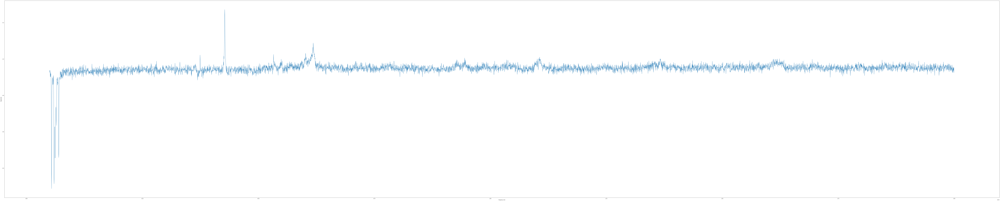

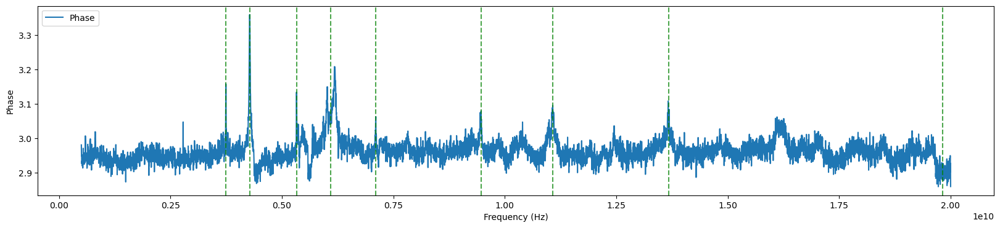

In [37]:
    power_index= 50 
    # Extract the single-power cut

    freq_trace  = data['S21_mag']['RS_SMB100_frequency'][power_index]
    mag_trace   = data['S21_mag']['S21_mag'][power_index]
    phase_trace = data['S21_phase']['S21_phase'][power_index]
    phase_unwrapped= unph = np.unwrap(phase_trace)

    # Detect resonances
    indices, freq_res=detect_phase_spikes(freq_trace, phase_trace, prominence= 0.01, power_index=power_index)
    
    
    # Avoid spurious clustering of resonances
    freq_res = cluster_spikes(freq_res, spacing_threshold=25e7)
    
    #remember the data 
    freq_res_12_50=freq_res
    
    #  Plot of the results
    plt.figure(figsize=(200, 40))
    plt.plot(freq_trace, mag_trace, label='Magnitude (dB)')
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Magnitude')
    plt.show()

    plt.figure(figsize=(20, 4))
    plt.plot(freq_trace, phase_unwrapped, label='Phase')
    for fr in freq_res:
        plt.axvline(x=fr, color='green', linestyle='--', alpha=0.7)
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Phase')
    plt.legend()
    plt.show()

Resonance @ 3.743000 GHz, Q ≈ 311.9
Resonance @ 4.274000 GHz, Q ≈ 474.9
Resonance @ 5.327000 GHz, Q ≈ 197.3
Resonance @ 5.714000 GHz, Q ≈ 317.4
Resonance @ 5.747000 GHz, Q ≈ 319.3
Resonance @ 6.014000 GHz, Q ≈ 222.7
Resonance @ 6.092000 GHz, Q ≈ 253.8
Resonance @ 6.161000 GHz, Q ≈ 342.3
Resonance @ 6.176000 GHz, Q ≈ 686.2
Resonance @ 6.185000 GHz, Q ≈ 229.1
Resonance @ 9.470000 GHz, Q ≈ 631.3
Resonance @ 11.075000 GHz, Q ≈ 369.2
Resonance @ 13.661000 GHz, Q ≈ 1517.9
Resonance @ 16.106000 GHz, Q ≈ 671.1
Detected 15 phase spikes / resonances at power index 80:


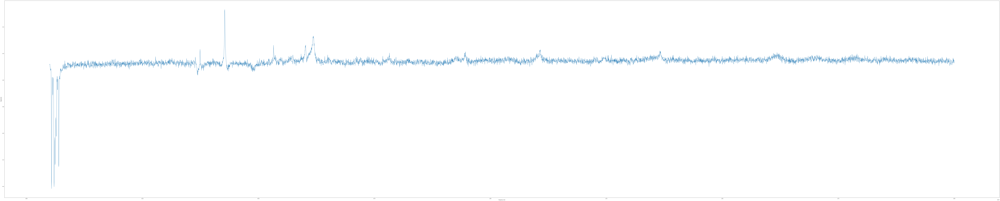

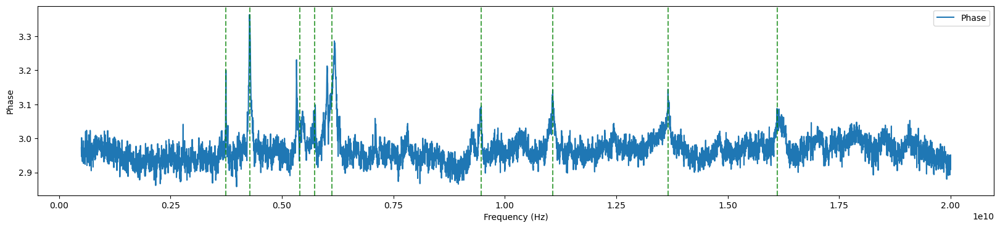

In [38]:
    power_index= 80 
    # Extract the single-power cut

    freq_trace  = data['S21_mag']['RS_SMB100_frequency'][power_index]
    mag_trace   = data['S21_mag']['S21_mag'][power_index]
    phase_trace = data['S21_phase']['S21_phase'][power_index]
    phase_unwrapped= unph = np.unwrap(phase_trace)

    # Detect resonances
    indices, freq_res=detect_phase_spikes(freq_trace, phase_trace, prominence= 0.012, power_index=power_index)
    
    
    # Avoid spurious clustering of resonances
    freq_res = cluster_spikes(freq_res, spacing_threshold=25e7)
    
      #remember the data 
    freq_res_12_80=freq_res
    
    #  Plot of the results
    plt.figure(figsize=(200, 40))
    plt.plot(freq_trace, mag_trace, label='Magnitude (dB)')
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Magnitude')
    plt.show()

    plt.figure(figsize=(20, 4))
    plt.plot(freq_trace, phase_unwrapped, label='Phase')
    for fr in freq_res:
        plt.axvline(x=fr, color='green', linestyle='--', alpha=0.7)
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Phase')
    plt.legend()
    plt.show()

Resonance @ 2.783000 GHz, Q ≈ 463.8
Resonance @ 3.740000 GHz, Q ≈ 249.3
Resonance @ 3.788000 GHz, Q ≈ 420.9
Resonance @ 4.274000 GHz, Q ≈ 142.5
Resonance @ 4.334000 GHz, Q ≈ 481.6
Resonance @ 5.327000 GHz, Q ≈ 222.0
Resonance @ 5.363000 GHz, Q ≈ 595.9
Resonance @ 5.459000 GHz, Q ≈ 182.0
Resonance @ 5.714000 GHz, Q ≈ 317.4
Resonance @ 5.747000 GHz, Q ≈ 319.3
Resonance @ 6.011000 GHz, Q ≈ 222.6
Resonance @ 6.107000 GHz, Q ≈ 290.8
Resonance @ 6.167000 GHz, Q ≈ 342.6
Resonance @ 6.191000 GHz, Q ≈ 229.3
Resonance @ 7.097000 GHz, Q ≈ 394.3
Resonance @ 9.464000 GHz, Q ≈ 1051.6
Resonance @ 10.988000 GHz, Q ≈ 610.4
Resonance @ 11.072000 GHz, Q ≈ 369.1
Resonance @ 13.670000 GHz, Q ≈ 506.3
Resonance @ 16.055000 GHz, Q ≈ 1070.3
Resonance @ 16.148000 GHz, Q ≈ 2691.3
Detected 21 phase spikes / resonances at power index 100:


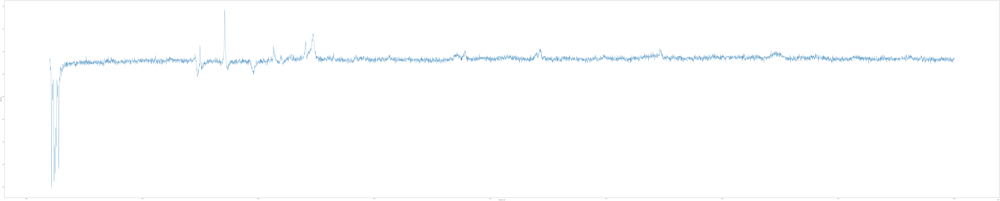

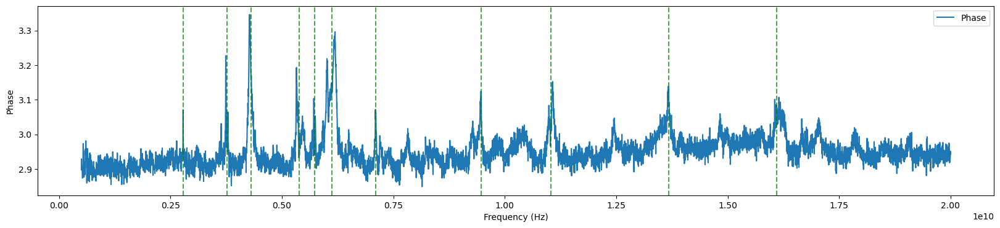

In [39]:
    power_index= 100 
    # Extract the single-power cut

    freq_trace  = data['S21_mag']['RS_SMB100_frequency'][power_index]
    mag_trace   = data['S21_mag']['S21_mag'][power_index]
    phase_trace = data['S21_phase']['S21_phase'][power_index]
    phase_unwrapped= unph = np.unwrap(phase_trace)

    # Detect resonances
    indices, freq_res=detect_phase_spikes(freq_trace, phase_trace, prominence= 0.012, power_index=power_index)
    
    
    # Avoid spurious clustering of resonances
    freq_res = cluster_spikes(freq_res, spacing_threshold=25e7)
    
      #remember the data 
    freq_res_12_100=freq_res
    
    #  Plot of the results
    plt.figure(figsize=(200, 40))
    plt.plot(freq_trace, mag_trace, label='Magnitude (dB)')
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Magnitude')
    plt.show()

    plt.figure(figsize=(20, 4))
    plt.plot(freq_trace, phase_unwrapped, label='Phase')
    for fr in freq_res:
        plt.axvline(x=fr, color='green', linestyle='--', alpha=0.7)
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Phase')
    plt.legend()
    plt.show()

In [40]:
# Replace with the actual run ID you want to load: I want to study run 12 and 15 
run_id = 15
dataset = load_by_run_spec(captured_run_id=run_id)
dataset

print("\n")

data = dataset.get_parameter_data()

# Print all the available parameter names and their shapes
for group, params in data.items():
    print(f"\nGroup: {group}")
    for param, values in params.items():
        print(f" - {param}: shape {np.shape(values)}")




Group: S21_mag
 - S21_mag: shape (101, 6501)
 - RS_SMB100_power: shape (101, 6501)
 - RS_SMB100_frequency: shape (101, 6501)

Group: S21_phase
 - S21_phase: shape (101, 6501)
 - RS_SMB100_power: shape (101, 6501)
 - RS_SMB100_frequency: shape (101, 6501)


Resonance @ 0.524000 GHz, Q ≈ 29.1
Resonance @ 3.602000 GHz, Q ≈ 120.1
Resonance @ 5.222000 GHz, Q ≈ 248.7
Resonance @ 5.480000 GHz, Q ≈ 304.4
Resonance @ 6.434000 GHz, Q ≈ 306.4
Resonance @ 6.506000 GHz, Q ≈ 361.4
Resonance @ 13.604000 GHz, Q ≈ 2267.3
Detected 7 phase spikes / resonances at power index 50:


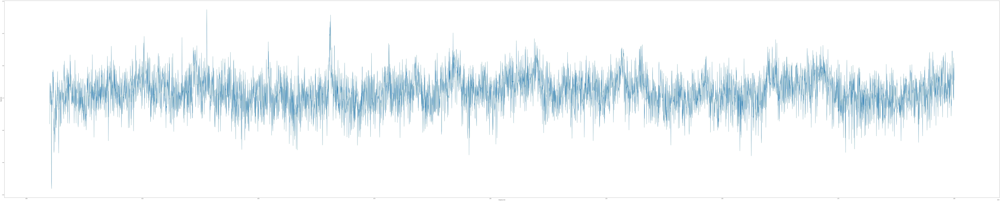

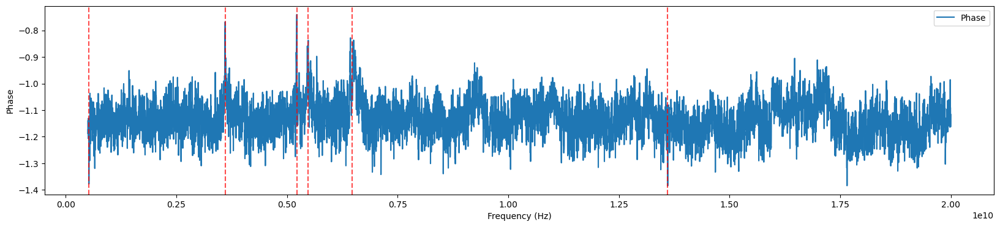

In [41]:
    power_index= 50 
    # Extract the single-power cut

    freq_trace  = data['S21_mag']['RS_SMB100_frequency'][power_index]
    mag_trace   = data['S21_mag']['S21_mag'][power_index]
    phase_trace = data['S21_phase']['S21_phase'][power_index]
    phase_unwrapped= unph = np.unwrap(phase_trace)

    # Detect resonances
    indices, freq_res=detect_phase_spikes(freq_trace, phase_trace, prominence= 0.06, power_index=power_index)
    
    
    # Avoid spurious clustering of resonances
    freq_res = cluster_spikes(freq_res, spacing_threshold=25e7)
    
    #remember the data 
    freq_res_15_50=freq_res
    
    #  Plot of the results
    plt.figure(figsize=(200, 40))
    plt.plot(freq_trace, mag_trace, label='Magnitude (dB)')
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Magnitude')
    plt.show()

    plt.figure(figsize=(20, 4))
    plt.plot(freq_trace, phase_unwrapped, label='Phase')
    for fr in freq_res:
        plt.axvline(x=fr, color='red', linestyle='--', alpha=0.7)
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Phase')
    plt.legend()
    plt.show()

Resonance @ 0.542000 GHz, Q ≈ 30.1
Resonance @ 1.832000 GHz, Q ≈ 101.8
Resonance @ 3.377000 GHz, Q ≈ 375.2
Resonance @ 3.608000 GHz, Q ≈ 133.6
Resonance @ 3.626000 GHz, Q ≈ 604.3
Resonance @ 3.686000 GHz, Q ≈ 175.5
Resonance @ 3.893000 GHz, Q ≈ 144.2
Resonance @ 5.213000 GHz, Q ≈ 347.5
Resonance @ 5.228000 GHz, Q ≈ 249.0
Resonance @ 5.504000 GHz, Q ≈ 366.9
Resonance @ 5.669000 GHz, Q ≈ 314.9
Resonance @ 6.425000 GHz, Q ≈ 267.7
Resonance @ 6.473000 GHz, Q ≈ 359.6
Resonance @ 6.485000 GHz, Q ≈ 216.2
Resonance @ 6.497000 GHz, Q ≈ 360.9
Resonance @ 9.251000 GHz, Q ≈ 616.7
Resonance @ 9.386000 GHz, Q ≈ 625.7
Resonance @ 13.130000 GHz, Q ≈ 437.7
Resonance @ 15.428000 GHz, Q ≈ 514.3
Detected 19 phase spikes / resonances at power index 80:


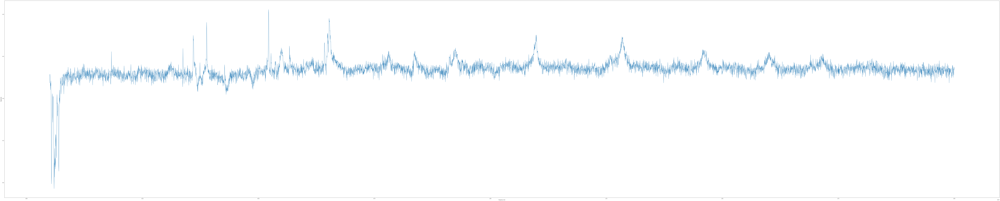

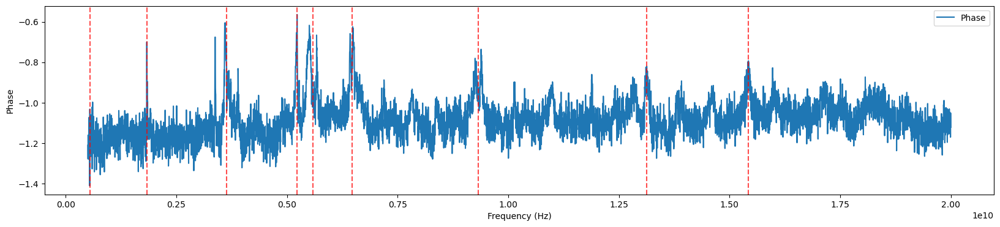

In [42]:
    power_index= 80 
    # Extract the single-power cut

    freq_trace  = data['S21_mag']['RS_SMB100_frequency'][power_index]
    mag_trace   = data['S21_mag']['S21_mag'][power_index]
    phase_trace = data['S21_phase']['S21_phase'][power_index]
    phase_unwrapped= unph = np.unwrap(phase_trace)

    # Detect resonances
    indices, freq_res=detect_phase_spikes(freq_trace, phase_trace, prominence= 0.06, power_index=power_index)
    
    
    # Avoid spurious clustering of resonances
    freq_res = cluster_spikes(freq_res, spacing_threshold=25e7)
    
    #remember the data 
    freq_res_15_80=freq_res
    
    #  Plot of the results
    plt.figure(figsize=(200, 40))
    plt.plot(freq_trace, mag_trace, label='Magnitude (dB)')
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Magnitude')
    plt.show()

    plt.figure(figsize=(20, 4))
    plt.plot(freq_trace, phase_unwrapped, label='Phase')
    for fr in freq_res:
        plt.axvline(x=fr, color='red', linestyle='--', alpha=0.7)
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Phase')
    plt.legend()
    plt.show()

Resonance @ 0.527000 GHz, Q ≈ 29.3
Resonance @ 0.539000 GHz, Q ≈ 18.0
Resonance @ 0.593000 GHz, Q ≈ 65.9
Resonance @ 0.614000 GHz, Q ≈ 22.7
Resonance @ 0.620000 GHz, Q ≈ 25.8
Resonance @ 0.629000 GHz, Q ≈ 34.9
Resonance @ 0.650000 GHz, Q ≈ 36.1
Resonance @ 1.832000 GHz, Q ≈ 152.7
Resonance @ 3.380000 GHz, Q ≈ 112.7
Resonance @ 3.584000 GHz, Q ≈ 199.1
Resonance @ 3.662000 GHz, Q ≈ 203.4
Resonance @ 5.201000 GHz, Q ≈ 1733.7
Resonance @ 5.237000 GHz, Q ≈ 249.4
Resonance @ 5.441000 GHz, Q ≈ 302.3
Resonance @ 5.531000 GHz, Q ≈ 921.8
Resonance @ 5.657000 GHz, Q ≈ 209.5
Resonance @ 6.464000 GHz, Q ≈ 2154.7
Resonance @ 8.249000 GHz, Q ≈ 916.6
Resonance @ 9.362000 GHz, Q ≈ 624.1
Resonance @ 10.139000 GHz, Q ≈ 482.8
Resonance @ 13.112000 GHz, Q ≈ 1092.7
Resonance @ 15.437000 GHz, Q ≈ 857.6
Detected 22 phase spikes / resonances at power index 100:


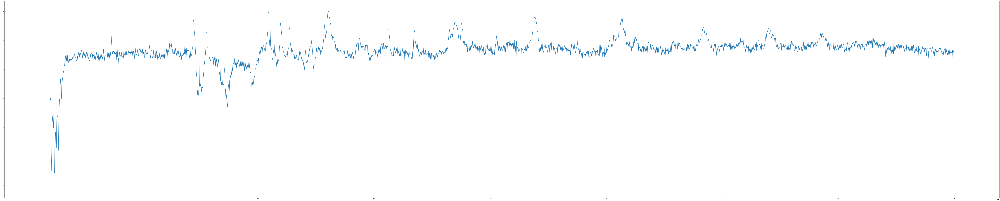

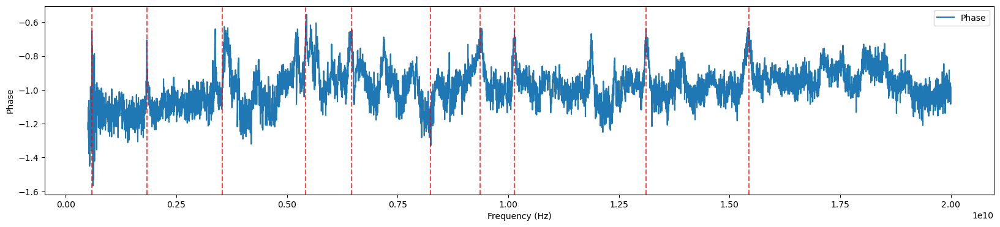

In [43]:
    power_index= 100 
    # Extract the single-power cut

    freq_trace  = data['S21_mag']['RS_SMB100_frequency'][power_index]
    mag_trace   = data['S21_mag']['S21_mag'][power_index]
    phase_trace = data['S21_phase']['S21_phase'][power_index]
    phase_unwrapped= unph = np.unwrap(phase_trace)

    # Detect resonances
    indices, freq_res=detect_phase_spikes(freq_trace, phase_trace, prominence= 0.1, power_index=power_index)
    
    
    # Avoid spurious clustering of resonances
    freq_res = cluster_spikes(freq_res, spacing_threshold=25e7)
    
    #remember the data 
    freq_res_15_100=freq_res
    
    #  Plot of the results
    plt.figure(figsize=(200, 40))
    plt.plot(freq_trace, mag_trace, label='Magnitude (dB)')
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Magnitude')
    plt.show()

    plt.figure(figsize=(20, 4))
    plt.plot(freq_trace, phase_unwrapped, label='Phase')
    for fr in freq_res:
        plt.axvline(x=fr, color='red', linestyle='--', alpha=0.7)
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Phase')
    plt.legend()
    plt.show()

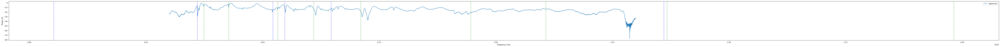

In [44]:
# Power index 50 

plt.figure(figsize=(100, 4))
plt.plot(freq_rear, mag_rear, label='Spectrum')
for fr in freq_res_15_50:
    plt.axvline(x=fr, color='blue', linestyle='--', alpha=0.7)
for fr in freq_res_12_50:
    plt.axvline(x=fr, color='green', linestyle='--', alpha=0.7)
plt.xlabel('Frequency (Hz)')
plt.ylabel('Phase_50')
plt.legend()
plt.show()

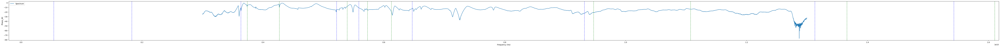

In [45]:
# Power index 80 

plt.figure(figsize=(100, 4))
plt.plot(freq_rear, mag_rear, label='Spectrum')
for fr in freq_res_15_80:
    plt.axvline(x=fr, color='blue', linestyle='--', alpha=0.7)
for fr in freq_res_12_80:
    plt.axvline(x=fr, color='green', linestyle='--', alpha=0.7)
plt.xlabel('Frequency (Hz)')
plt.ylabel('Phase_80')
plt.legend()
plt.show()

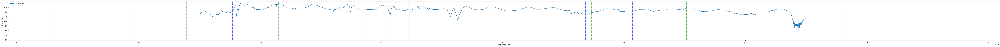

In [46]:
# Power index 100 

plt.figure(figsize=(100, 4))
plt.plot(freq_rear, mag_rear, label='Spectrum')
for fr in freq_res_15_100:
    plt.axvline(x=fr, color='blue', linestyle='--', alpha=0.7)
for fr in freq_res_12_100:
    plt.axvline(x=fr, color='green', linestyle='--', alpha=0.7)
plt.xlabel('Frequency (Hz)')
plt.ylabel('Phase_100')
plt.legend()
plt.show()

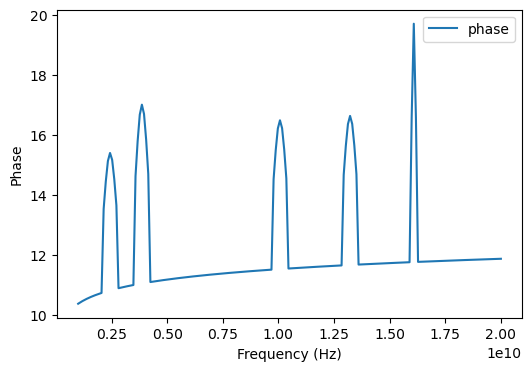

Resonance @ 2.432161 GHz, Q ≈ 3.2
Resonance @ 3.577889 GHz, Q ≈ 6.2
Resonance @ 4.150754 GHz, Q ≈ 7.2
Resonance @ 10.070352 GHz, Q ≈ 13.2
Resonance @ 13.221106 GHz, Q ≈ 17.3
Resonance @ 15.989950 GHz, Q ≈ 41.9
Resonance @ 16.180905 GHz, Q ≈ 42.4
Detected 7 phase spikes / resonances at power index 50:


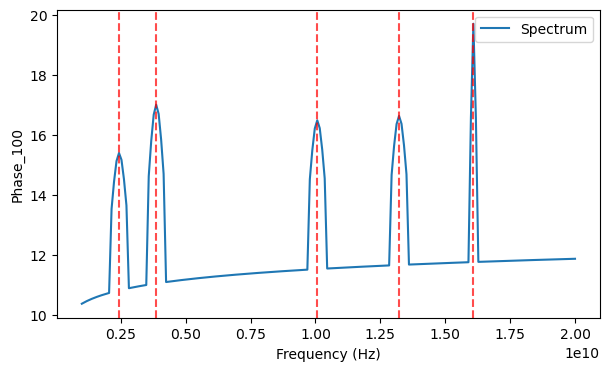

In [47]:
# ---- Load data -----------------------------------------------------------
freq_trace = np.load(r"C:\Users\Nicola\Documents\CdL_Fisica\INTERNSHIP\FBK_superconducting_circuits\23_05\frequency_array.npy")  # frequency in Hz
phase_trace = np.load(r"C:\Users\Nicola\Documents\CdL_Fisica\INTERNSHIP\FBK_superconducting_circuits\23_05\phase_array.npy")    # phase in radians
    
    #Plot Fake data 
plt.figure(figsize=(6, 4))
plt.plot(freq_trace, phase_trace, label='phase')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Phase')
plt.legend()
plt.show()
    
power_index= 50 #this actually makes no sense, I write it just because the function needs a power index as an input 
    
    # Detect resonances
indices, freq_res=detect_phase_spikes(freq_trace, phase_trace, prominence=0.07, power_index=power_index)
      # Avoid spurious clustering of resonances
freq_res = cluster_spikes(freq_res, spacing_threshold=80e7)
    
plt.figure(figsize=(7, 4))
plt.plot(freq_trace, phase_trace, label='Spectrum')
for fr in freq_res:
    plt.axvline(x=fr, color='red', linestyle='--', alpha=0.7)
plt.xlabel('Frequency (Hz)')
plt.ylabel('Phase_100')
plt.legend()
plt.show()

It has been seen , from these fake data, that the smoothed data modifies some spikes. Those modified spikes are attenuated and divided in 2, so that 7 spikes are detected by the detect_spikes function.  The problem is solved  by clustering. We cannot remove the problem if it happens because it comes from the unwrap function, which is essential for the phase. It has been verified that the polyfit that fits a linear baseline and subtracts that to the unwrapped phase to create the variable smoothed phase works well: that is not the problem . 